# Model Analysis Notebook

Loads a trained model from an experiment directory and runs:
1. **Error analysis** – per-station spatial error maps, rankings, bias map, isolation plot
2. **Grid prediction** – predicted rainfall interpolated onto a regular 1 km grid

In [2]:
from src.sampling.main import stratified_spatial_kfold_dual  # must be first

import torch
import numpy as np
import matplotlib.pyplot as plt
import contextily as cx
import pandas as pd

from torch_geometric.loader import DataLoader as GeometricDataLoader

from models.gnn import GNNInductiveHetero
from src.utils import read_config
from src.raingauge.utils import load_raingauge_dataset
from src.radar.utils import load_radar_dataset, load_processed_dataset
from src.cml.utils import load_cml_dataset
from src.graph.gaugegraphnew import GaugeGraphNew, HeterogeneousWeatherGraphDatasetInductive
from src.graph.radargraph import RadarGraph
from src.graph.cmlgraph import CMLGraph

from src.visualization.error_analysis import (
    analyze_station_errors,
    load_fold_metrics,
    predict_on_test_stations,
    plot_station_rainfall_timeseries,
    get_viz_scales,
    add_pearson_r,
    compute_pearson_r_all_folds,
)
from src.visualization.grid_prediction import predict_on_grid, plot_rainfall_grid, plot_rainfall_sequence, animate_rainfall_grid
from src.visualization.main import visualise_singapore_outline

%load_ext autoreload
%autoreload 2

/opt/miniconda3/envs/fyp/lib/python3.13/site-packages/requests/__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


## Configuration

Set the experiment name and fold index here.

In [3]:
# ── CHANGE THESE ──────────────────────────────────────────────────────────────
EXPERIMENT_NAME = "raingauge_cml_radar_final"
FOLD_IDX        = 0          # which fold's weights to load for grid prediction
# ──────────────────────────────────────────────────────────────────────────────

EXPERIMENT_DIR  = f"experiments/{EXPERIMENT_NAME}"
WEIGHTS_PATH    = f"{EXPERIMENT_DIR}/weather_gnn_best_{FOLD_IDX}.pth"

config  = read_config("config.yaml")
device  = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BOUNDS  = config["dataset_parameters"]["geography_bounds"]
FOLD_COUNT = config["training_params"]["fold_count"]
DATA_SOURCES = config["datasources"]

# Analysis / time-window settings
_viz = config.get("analysis", {})
TIME_START       = _viz.get("time_start", None)
TIME_END         = _viz.get("time_end",   None)
SELECTED_STATION = _viz.get("selected_station", None)
TS_DISPLAY_START = _viz.get("ts_display_start", None)
TS_FRAME_COUNT   = _viz.get("ts_frame_count", None)

# Fixed visualisation scales — loaded from config.yaml visualisation section
SCALES          = get_viz_scales("config.yaml")
COMPARE_METRICS = SCALES["compare_metrics"]   # e.g. ['rmse', 'pearson_r']
METRIC_SCALES   = SCALES["metric_scales"]     # {metric: {vmin, vmax, boundaries}}
RAINFALL_SCALE  = SCALES["rainfall"]          # {vmin, vmax, boundaries}

# ── Infer LPE setting from checkpoint BEFORE building graphs ──────────────────
# GaugeGraphNew reads config['dataset_parameters']['include_lpe'] directly,
# so we patch it here to match what the model was actually trained with.
_DATA_FEATURE_DIM = 2
_ckpt_sd = torch.load(WEIGHTS_PATH, map_location="cpu")
_raingauge_in = _DATA_FEATURE_DIM  # default: no LPE
for _k, _v in _ckpt_sd.items():
    if _k.startswith("convs.0.convs.raingauge") and _k.endswith("lin_rel.weight"):
        _raingauge_in = int(_v.shape[1])
        break
_ckpt_include_lpe = _raingauge_in > _DATA_FEATURE_DIM
if config["dataset_parameters"]["include_lpe"] != _ckpt_include_lpe:
    print(f"⚠  config include_lpe={config['dataset_parameters']['include_lpe']} "
          f"but checkpoint has raingauge_in={_raingauge_in} → overriding to {_ckpt_include_lpe}")
    config["dataset_parameters"]["include_lpe"] = _ckpt_include_lpe
# ─────────────────────────────────────────────────────────────────────────────

print(f"Experiment   : {EXPERIMENT_NAME}")
print(f"Weights      : {WEIGHTS_PATH}")
print(f"Device       : {device}")
print(f"Bounds       : {BOUNDS}")
print(f"Folds        : {FOLD_COUNT}")
print(f"Data sources : {DATA_SOURCES}")
print(f"Include LPE  : {config['dataset_parameters']['include_lpe']}  (from checkpoint)")
print(f"Time window  : {TIME_START} → {TIME_END}  (None = full period)")
print(f"Compare      : {COMPARE_METRICS}")
print(f"Rainfall scale: vmin={RAINFALL_SCALE['vmin']}, vmax={RAINFALL_SCALE['vmax']}")

⚠  config include_lpe=True but checkpoint has raingauge_in=2 → overriding to False
Experiment   : raingauge_cml_radar_final
Weights      : experiments/raingauge_cml_radar_final/weather_gnn_best_0.pth
Device       : cpu
Bounds       : {'left': 103.6, 'right': 104.1, 'top': 1.5, 'bottom': 1.188}
Folds        : 5
Data sources : ['raingauge', 'cml', 'radar']
Include LPE  : False  (from checkpoint)
Time window  : 2024-06-17 → 2025-04-30  (None = full period)
Compare      : ['rmse', 'pearson_r']
Rainfall scale: vmin=0, vmax=50


## Load Datasets

In [4]:
uptime_threshold = config["filters"]["uptime_threshold"]
start_year       = config["dataset_parameters"]["start_year"]
end_year         = config["dataset_parameters"]["end_year"]

time_start = pd.Timestamp(config["analysis"]["time_start"])
time_end   = pd.Timestamp(config["analysis"]["time_end"])

# ── Raingauge ────────────────────────────────────────────────────────────────
# Load, resample 5-min → 15-min averages, filter to analysis window.
raingauge_df, mapping_df = load_raingauge_dataset(
    start=start_year, end=end_year, uptime_threshold=uptime_threshold
)
raingauge_df = raingauge_df.resample("15min", closed="left", label="left").mean()
raingauge_df = raingauge_df[raingauge_df.index.minute % 15 == 0]
raingauge_df = raingauge_df[
    (raingauge_df.index >= time_start) & (raingauge_df.index <= time_end)
]
raingauge_df = raingauge_df.reset_index().rename(columns={"index": "timestamp"})

# ── Radar ────────────────────────────────────────────────────────────────────
# Load the processed pkl (already cropped, 15-min, SGT). No padding needed.
if "radar" in DATA_SOURCES:
    radar_df = load_processed_dataset("database/processed_radar_dataset.pkl")
    radar_df = radar_df.sort_values("timestamp").reset_index(drop=True)
else:
    radar_df = None

# ── CML ──────────────────────────────────────────────────────────────────────
# Load raw CML readings. No padding needed — inner join handles alignment.
if "cml" in DATA_SOURCES:
    cml_df, cml_coordinates_df = load_cml_dataset(config["dataset_parameters"]["cml_folder"])
    cml_df = cml_df.sort_values("timestamp").reset_index(drop=True)
else:
    cml_df, cml_coordinates_df = None, None

print(f"Raingauge : {raingauge_df.shape}  |  {raingauge_df['timestamp'].min()} → {raingauge_df['timestamp'].max()}")
if radar_df  is not None: print(f"Radar     : {radar_df.shape}  |  {radar_df['timestamp'].min()} → {radar_df['timestamp'].max()}")
if cml_df    is not None: print(f"CML       : {cml_df.shape}  |  {cml_df['timestamp'].min()} → {cml_df['timestamp'].max()}")
print(f"Mapping   : {mapping_df.shape}")


Loading raingauge data from 2024 to 2025
Loading raingauge_dataset from database/raingauge_nea_data/2024/weather_station_data_2024.csv
Loading raingauge_dataset from database/raingauge_nea_data/2025/weather_station_data_2025.csv
Loading complete
Dataframe shape: (209691, 70)
Filtering raingauge_uptime. Threshold = 0.9
Getting raingauge coordinate mappings
Mapping df shape: (51, 4)
Raingauge : (30433, 52)  |  2024-06-17 00:00:00 → 2025-04-30 00:00:00
Radar     : (31503, 5)  |  2024-06-01 08:00:00 → 2025-05-01 07:45:00
CML       : (25251516, 21)  |  2024-06-17 02:00:00 → 2025-04-30 23:45:00
Mapping   : (51, 6)


## Align Timestamps (Radar + Raingauge + CML)

In [5]:
import pandas as pd

# Capture station-only columns (exclude 'timestamp') for each source
gauge_station_cols = [c for c in raingauge_df.columns if c != "timestamp"]
radar_cols         = list(radar_df.columns)  if radar_df is not None else None
cml_cols           = list(cml_df.columns)    if cml_df   is not None else None

# Inner-join on timestamp across whichever sources are active.
# Radar is the most constrained (fewest rows), so start from it when present.
if radar_df is not None:
    merged_df = radar_df.merge(raingauge_df, how="inner", on="timestamp")
else:
    merged_df = raingauge_df.copy()

if cml_df is not None:
    merged_df = merged_df.merge(cml_df, how="inner", on="timestamp")

# Sort and deduplicate on timestamp only
merged_df = (
    merged_df
    .sort_values("timestamp")
    .drop_duplicates(subset="timestamp")
    .reset_index(drop=True)
)

# Re-extract each aligned dataframe from the deduplicated merged view
raingauge_df = merged_df[gauge_station_cols].reset_index(drop=True)

if radar_df is not None:
    radar_df = merged_df[radar_cols].reset_index(drop=True)

if cml_df is not None:
    cml_df = merged_df[cml_cols].reset_index(drop=True)

aligned_timestamps = merged_df["timestamp"].reset_index(drop=True)

print(f"Aligned raingauge : {raingauge_df.shape}")
if radar_df  is not None: print(f"Aligned radar     : {radar_df.shape}")
if cml_df    is not None: print(f"Aligned CML       : {cml_df.shape}")
print(f"Aligned timestamps: {len(aligned_timestamps)}")
print(f"Timestamp range   : {aligned_timestamps.iloc[0]}  →  {aligned_timestamps.iloc[-1]}")

Aligned raingauge : (29935, 51)
Aligned radar     : (29935, 5)
Aligned CML       : (29935, 21)
Aligned timestamps: 29935
Timestamp range   : 2024-06-17 02:00:00  →  2025-04-30 00:00:00


## Rebuild Graph for Each Fold

In [6]:
layer_cfg = config["layer_connect"]

split_info = stratified_spatial_kfold_dual(
    mapping_df, seed=config["training_params"]["seed"], plot=False, n_splits=FOLD_COUNT
)

gauge_graph_arr = []
for i in range(FOLD_COUNT):
    gauge_graph = GaugeGraphNew(
        raingauge_df, mapping_df,
        split_info=split_info[i],
        knn=layer_cfg["gauge_gauge"],
    )

    if "radar" in DATA_SOURCES:
        radar_graph      = RadarGraph(radar_df)
        radar_heterodata = radar_graph.get_radar_heterodata()
        gauge_graph.add_heterodata(
            heterodata_layer=radar_heterodata,
            coords=radar_graph.grid_coords,
            layer_name="radar",
            knn=layer_cfg["radar_gauge"],
        )

    if "cml" in DATA_SOURCES:
        cml_graph      = CMLGraph(cml_df, cml_coordinates_df)
        cml_heterodata = cml_graph.get_heterodata()
        gauge_graph.add_heterodata(
            heterodata_layer=cml_heterodata,
            coords=cml_coordinates_df,
            layer_name="cml",
            knn=layer_cfg["cml_gauge"],
        )

    gauge_graph_arr.append(gauge_graph)

print("Graphs built for all folds.")

SPATIAL K-FOLD STRATIFIED SAMPLING (Fixed)
Total stations: 51
Clusters: 8
Folds: 5
Random seed: 123
--------------------------------------------------------------------------------
Cluster 0: 2 stations → 2 test assignments, 0 always-train
Cluster 1: 7 stations → 5 test assignments, 2 always-train
Cluster 2: 6 stations → 5 test assignments, 1 always-train
Cluster 3: 13 stations → 5 test assignments, 8 always-train
Cluster 4: 7 stations → 5 test assignments, 2 always-train
Cluster 5: 7 stations → 5 test assignments, 2 always-train
Cluster 6: 4 stations → 4 test assignments, 0 always-train
Cluster 7: 5 stations → 5 test assignments, 0 always-train

Creating Fold 1/5
Test stations: 8 (should be ~8)
Train pool: 43
Fold 1 summary:
  Statistical train: 43 (84.3%)
  Test: 8 (15.7%)
  ML train: 35 (68.6%)
  ML validation: 8 (15.7%)

Creating Fold 2/5
Test stations: 8 (should be ~8)
Train pool: 43
Fold 2 summary:
  Statistical train: 43 (84.3%)
  Test: 8 (15.7%)
  ML train: 35 (68.6%)
  ML vali

/opt/miniconda3/envs/fyp/lib/python3.13/site-packages/shapely/measurement.py:81: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/opt/miniconda3/envs/fyp/lib/python3.13/site-packages/shapely/measurement.py:81: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/opt/miniconda3/envs/fyp/lib/python3.13/site-packages/shapely/measurement.py:81: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/opt/miniconda3/envs/fyp/lib/python3.13/site-packages/shapely/measurement.py:81: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/opt/miniconda3/envs/fyp/lib/python3.13/site-packages/shapely/measurement.py:81: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/opt/miniconda3/envs/fyp/lib/python3.13/site-packages/shapely/measurement.py:81: RuntimeWarning: invalid value encountered in distance


Graphs built for all folds.


/opt/miniconda3/envs/fyp/lib/python3.13/site-packages/shapely/measurement.py:81: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)


## Infer Model Architecture from Checkpoint

Reads `hidden_channels` and `num_layers` directly from the saved state-dict so the model definition matches the checkpoint without any manual editing.

In [7]:
def infer_arch(weights_path: str):
    """Return (num_layers, hidden_channels, raingauge_in, edge_types) from a GNNInductiveHetero checkpoint.

    raingauge_in is the actual input feature dim the model was trained with.
    If it equals _DATA_FEATURE_DIM (2), the model was trained without LPE.
    If it is larger, LPE was used and lpe_k = raingauge_in - _DATA_FEATURE_DIM.

    edge_types is inferred from the conv key names in the checkpoint so that
    the model can be instantiated with exactly the edge types it was trained on,
    regardless of which DATA_SOURCES are active in config.
    """
    _DATA_FEATURE_DIM = 2
    sd = torch.load(weights_path, map_location="cpu")
    conv_keys = [k for k in sd if k.startswith("convs.")]
    num_layers = max(int(k.split(".")[1]) for k in conv_keys) + 1
    lin_w = sd["lin.weight"]
    hidden_channels = lin_w.shape[1]

    # Infer raingauge input feature dim from GraphConv lin_rel weights
    raingauge_in = _DATA_FEATURE_DIM   # default: no LPE
    for k, v in sd.items():
        if (k.startswith("convs.0.convs.raingauge")
                and k.endswith("lin_rel.weight")):
            raingauge_in = int(v.shape[1])
            break

    # Infer edge types from conv-0 keys.
    # PyG stores them as  convs.0.convs.<src___rel___dst>.lin_rel.weight
    import re
    edge_type_set = set()
    for k in sd:
        m = re.match(r"convs\.0\.convs\.<(.+?)>\.lin_rel\.weight", k)
        if m:
            parts = m.group(1).split("___")
            if len(parts) == 3:
                edge_type_set.add(tuple(parts))
    edge_types = sorted(edge_type_set)  # deterministic order

    return num_layers, hidden_channels, raingauge_in, edge_types

_DATA_FEATURE_DIM = 2
num_layers, hidden_channels, raingauge_in, ckpt_edge_types = infer_arch(WEIGHTS_PATH)
print(f"Detected  num_layers      = {num_layers}")
print(f"Detected  hidden_channels = {hidden_channels}")
print(f"Detected  raingauge_in    = {raingauge_in}  (data={_DATA_FEATURE_DIM}, lpe={raingauge_in - _DATA_FEATURE_DIM})")
print(f"Detected  edge_types      = {ckpt_edge_types}")

Detected  num_layers      = 5
Detected  hidden_channels = 32
Detected  raingauge_in    = 2  (data=2, lpe=0)
Detected  edge_types      = [('cml', 'connect', 'cml'), ('cml', 'connects', 'raingauge'), ('radar', 'connect', 'radar'), ('radar', 'connects', 'raingauge'), ('raingauge', 'connects', 'raingauge')]


## Instantiate & Load Model

In [8]:
test_heterodata = gauge_graph_arr[FOLD_IDX].get_test_heterodata()

# Use edge types inferred from the checkpoint rather than from the current
# graph — this ensures the model architecture matches the saved weights even
# if DATA_SOURCES in config differs from what the model was trained on.
model = GNNInductiveHetero(
    in_channels_dict={src: -1 for src in DATA_SOURCES},
    hidden_channels=hidden_channels,
    out_channels=1,
    num_layers=num_layers,
    edge_types=ckpt_edge_types,
).to(device)

model.load_state_dict(torch.load(WEIGHTS_PATH, map_location=device))
model.eval()
print(f"Model loaded from {WEIGHTS_PATH}")
print(model)

Model loaded from experiments/raingauge_cml_radar_final/weather_gnn_best_0.pth
GNNInductiveHetero(
  (dropout): Dropout(p=0.0, inplace=False)
  (convs): ModuleList(
    (0-4): 5 x HeteroConv(num_relations=5)
  )
  (lin): Linear(32, 1, bias=True)
)


---
# Part 1 – Error Analysis

Uses the pre-computed `per_station_metrics_f*.csv` files saved during testing.

In [9]:
import glob as _glob

csv_paths = sorted(_glob.glob(f"{EXPERIMENT_DIR}/per_station_metrics_f*.csv"))
print("Found metric CSVs:")
for p in csv_paths:
    print(" ", p)

Found metric CSVs:
  experiments/raingauge_cml_radar_final/per_station_metrics_f0.csv
  experiments/raingauge_cml_radar_final/per_station_metrics_f1.csv
  experiments/raingauge_cml_radar_final/per_station_metrics_f2.csv
  experiments/raingauge_cml_radar_final/per_station_metrics_f3.csv
  experiments/raingauge_cml_radar_final/per_station_metrics_f4.csv


In [10]:
# Train station IDs for the chosen fold (used in the isolation plot)
train_ids = split_info[FOLD_IDX]["ml"]["train"]

station_df = analyze_station_errors(
    csv_paths=csv_paths,
    mapping_df=mapping_df,
    bounds=BOUNDS,
    train_station_ids=train_ids,
    output_dir=f"{EXPERIMENT_DIR}/analysis",
    top_n=10,
    metrics=tuple(COMPARE_METRICS),
    scale_params=METRIC_SCALES,
)

station_df.sort_values("mae", ascending=False).head(10)


Loaded metrics for 36 unique test stations across 5 fold(s).

  id      mae     rmse      bias       f1
S211 1.413906 3.405368  0.753304 0.104491
S117 1.228843 2.487130  0.966101 0.092709
S217 1.094653 3.274689  0.480340 0.100028
S203 0.670072 3.155733  0.042312 0.610948
 S40 0.617722 2.484003  0.439720 0.668559
 S94 0.590820 2.727498  0.053363 0.518794
S113 0.562802 2.589089  0.044670 0.545736
S209 0.550005 3.546680 -0.204165 0.427208
 S33 0.504792 3.250365 -0.168644 0.335435
S227 0.346851 2.459088 -0.001616 0.720045

Figures saved to: /Users/jylow/Documents/FYP/rainfall_data_fusion/experiments/raingauge_cml_radar_final/analysis


,station_id,mae,rmse,bias,pearson_r,precision,recall,f1,support_pos,support_neg,n_folds,id,longitude,latitude
21,26,1.413906,3.405368,0.753304,0.466540,0.055129,0.998792,0.104491,1655.0,28375.0,1,S211,103.75711,1.42918
1,2,1.228843,2.487130,0.966101,0.455694,0.048621,0.994483,0.092709,1450.0,28580.0,1,S117,103.67900,1.25600
23,30,1.094653,3.274689,0.480340,0.367316,0.052647,1.000000,0.100028,1581.0,28449.0,1,S217,103.85526,1.35041
18,22,0.670072,3.155733,0.042312,0.288175,0.542320,0.699461,0.610948,1484.0,28546.0,1,S203,103.77020,1.29164
10,14,0.617722,2.484003,0.439720,0.679287,0.540965,0.874923,0.668559,1615.0,28415.0,1,S40,103.78962,1.40440
14,18,0.590820,2.727498,0.053363,0.225073,0.469075,0.580303,0.518794,1320.0,28710.0,1,S94,103.95280,1.36620
11,15,0.562802,2.589089,0.044670,0.220893,0.560956,0.531321,0.545736,1325.0,28705.0,1,S113,103.91040,1.30648
20,24,0.550005,3.546680,-0.204165,0.206230,0.608844,0.329044,0.427208,1632.0,28398.0,1,S209,103.84472,1.42111
5,8,0.504792,3.250365,-0.168644,0.155677,0.505063,0.251101,0.335435,1589.0,28441.0,1,S33,103.71000,1.30810
27,38,0.346851,2.459088,-0.001616,0.727102,0.676989,0.768951,0.720045,1649.0,28381.0,1,S227,103.80389,1.43944


In [11]:
# ── Pearson R across all folds ────────────────────────────────────────────────
# If the CSVs were produced by an updated cluster run they already contain
# pearson_r — no extra inference needed.  Otherwise, compute it locally.
if "pearson_r" in station_df.columns and station_df["pearson_r"].notna().any():
    print("pearson_r already loaded from CSVs — skipping local inference.")
else:
    print("pearson_r not found in CSVs. Computing from model inference across all folds …")
    print("(This may take several minutes on CPU.)")
    pearson_df = compute_pearson_r_all_folds(
        gauge_graph_arr=gauge_graph_arr,
        experiment_dir=EXPERIMENT_DIR,
        mapping_df=mapping_df,
        fold_count=FOLD_COUNT,
        model_cls=GNNInductiveHetero,
        device=device,
        infer_arch_fn=infer_arch,
    )
    station_df = station_df.merge(
        pearson_df[["id", "pearson_r"]],
        on="id",
        how="left",
        suffixes=("_old", ""),
    )
    if "pearson_r_old" in station_df.columns:
        station_df = station_df.drop(columns=["pearson_r_old"])
    print(f"Pearson R computed for {pearson_df['pearson_r'].notna().sum()} stations.")

print("\nBottom 10 stations by Pearson R:")
print(station_df[["id", "mae", "rmse", "pearson_r"]].sort_values("pearson_r").head(10).to_string(index=False))

pearson_r already loaded from CSVs — skipping local inference.

Bottom 10 stations by Pearson R:
  id      mae     rmse  pearson_r
 S33 0.504792 3.250365   0.155677
S209 0.550005 3.546680   0.206230
S113 0.562802 2.589089   0.220893
 S94 0.590820 2.727498   0.225073
S203 0.670072 3.155733   0.288175
S217 1.094653 3.274689   0.367316
S117 1.228843 2.487130   0.455694
S211 1.413906 3.405368   0.466540
S115 0.305706 2.492314   0.487202
S208 0.267591 1.683839   0.632343


---
## Per-Station Rainfall Time Series

Runs the model on every test timestep for the selected fold and collects
actual vs predicted per station.  This may take a minute on CPU.

Set `SELECTED_STATION` in the config cell (or `analysis.selected_station` in
`config.yaml`) to choose which station to plot.  Use `TIME_START` / `TIME_END`
to zoom into a particular event window.

In [12]:
# Run model inference on test stations to get per-station time series
# Uses aligned_timestamps (built in the timestamp alignment cell above)
print("Running per-station inference …")
station_predictions_df, station_actuals_df = predict_on_test_stations(
    model=model,
    heterodata=test_heterodata,
    mapping_df=mapping_df,
    timestamps=aligned_timestamps,
    device=device,
)
print(f"Done.  Shape: {station_predictions_df.shape}  "
      f"(timesteps × test stations)")
print(f"Test stations: {list(station_predictions_df.columns)}")

Running per-station inference …
Done.  Shape: (29935, 8)  (timesteps × test stations)
Test stations: ['S109', 'S119', 'S81', 'S201', 'S227', 'S229', 'S84', 'S115']


In [13]:
# station_df already has pearson_r merged from all-fold inference (cell above).
# The single-fold add_pearson_r call is no longer needed here.

Plotting station : S115
Time window      : 2024-06-17 → 2025-04-30


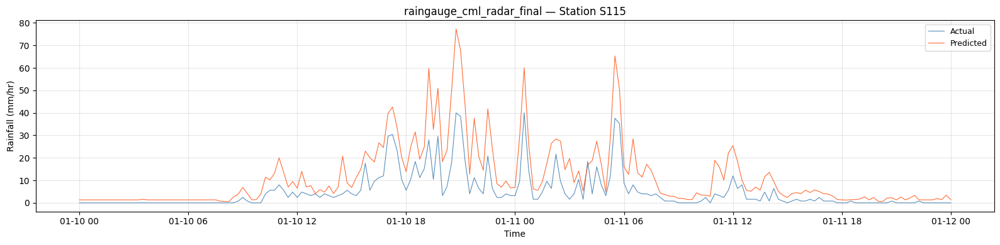

In [14]:
# ── Choose which station to plot ─────────────────────────────────────────────
_first_test = list(station_predictions_df.columns)[0]
STATION_ID  = SELECTED_STATION if SELECTED_STATION in station_predictions_df.columns \
              else _first_test
STATION_ID = 'S115'
print(f"Plotting station : {STATION_ID}")
print(f"Time window      : {TIME_START or 'start'} → {TIME_END or 'end'}")

fig, ax = plt.subplots(figsize=(16, 4))
plot_station_rainfall_timeseries(
    predictions_df=station_predictions_df,
    actuals_df=station_actuals_df,
    station_id='S84',
    time_start='2025-01-10',
    time_end='2025-01-12',
    title=f"{EXPERIMENT_NAME} — Station {STATION_ID}",
    ax=ax,
)
plt.tight_layout()
plt.show()

### Individual plots (inline)

The cells below reproduce each diagnostic plot inline so you can inspect them without opening saved files.

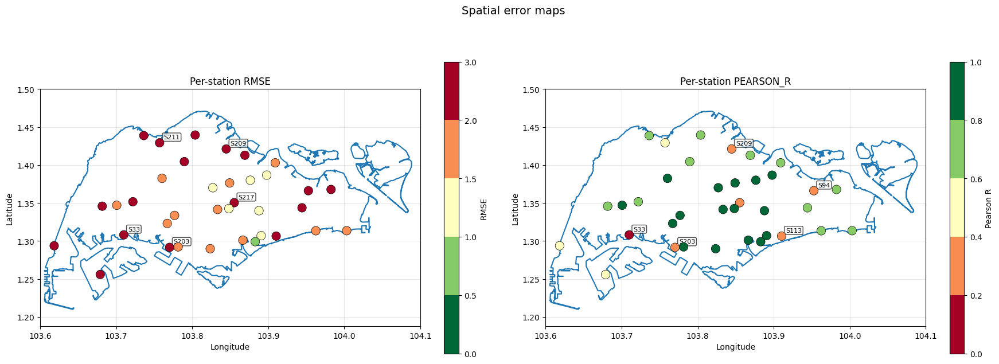

In [15]:
from src.visualization.error_analysis import (
    plot_spatial_error_map,
    plot_error_ranking,
    plot_bias_map,
    plot_error_vs_isolation,
)

# station_df now has pearson_r (added after inference) so all COMPARE_METRICS work here
m1, m2 = COMPARE_METRICS
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
plot_spatial_error_map(station_df, BOUNDS, metric=m1, ax=axes[0],
                       title=f"Per-station {m1.upper()}",
                       **METRIC_SCALES.get(m1, {}))
plot_spatial_error_map(station_df, BOUNDS, metric=m2, ax=axes[1],
                       title=f"Per-station {m2.upper()}",
                       **METRIC_SCALES.get(m2, {}))
fig.suptitle("Spatial error maps", fontsize=14)
plt.tight_layout()
plt.show()

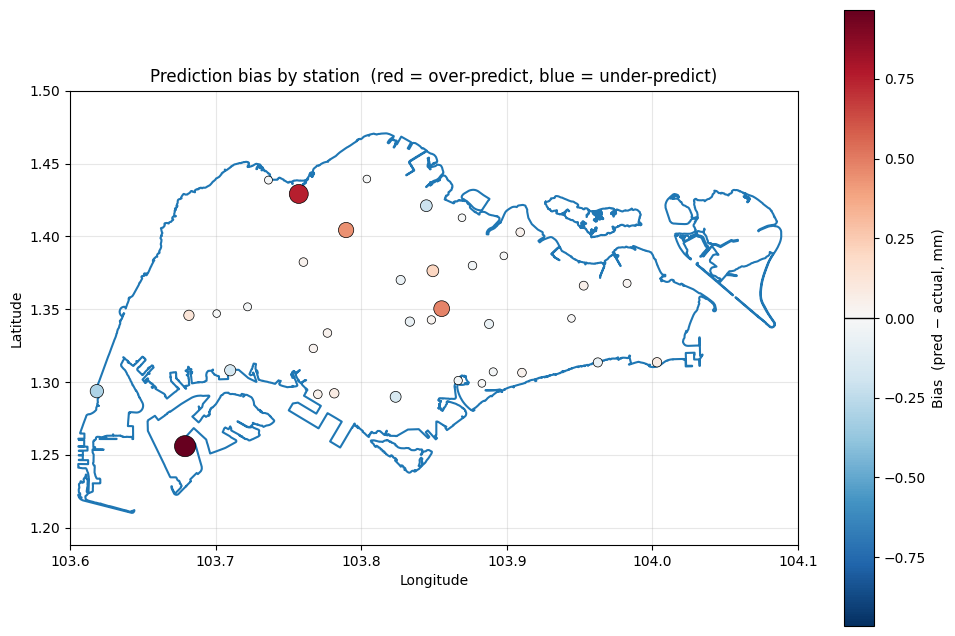

In [16]:
fig, ax = plt.subplots(figsize=(10, 8))
plot_bias_map(station_df, BOUNDS, top_n_labels=0, ax=ax)
visualise_singapore_outline(ax=ax)
plt.tight_layout()
plt.show()

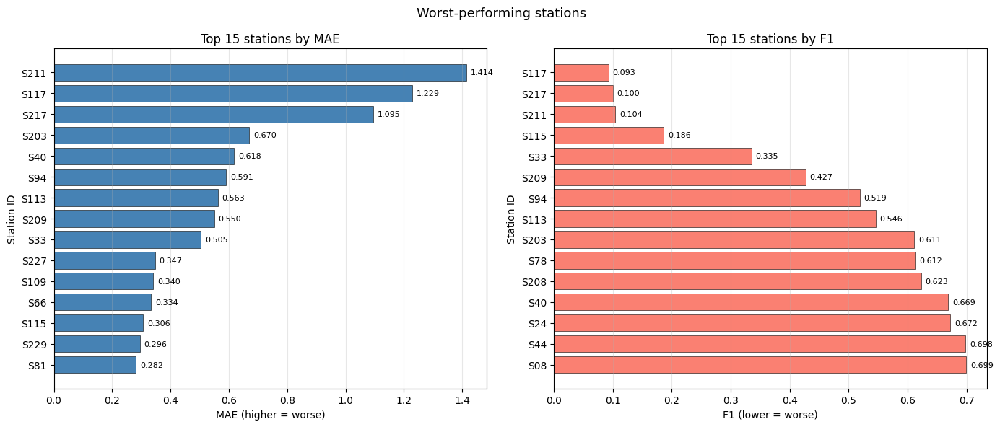

In [17]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
plot_error_ranking(station_df, metric="mae", top_n=15, ax=ax1)
plot_error_ranking(station_df, metric="f1",  top_n=15, ax=ax2)
fig.suptitle("Worst-performing stations", fontsize=13)
plt.tight_layout()
plt.show()

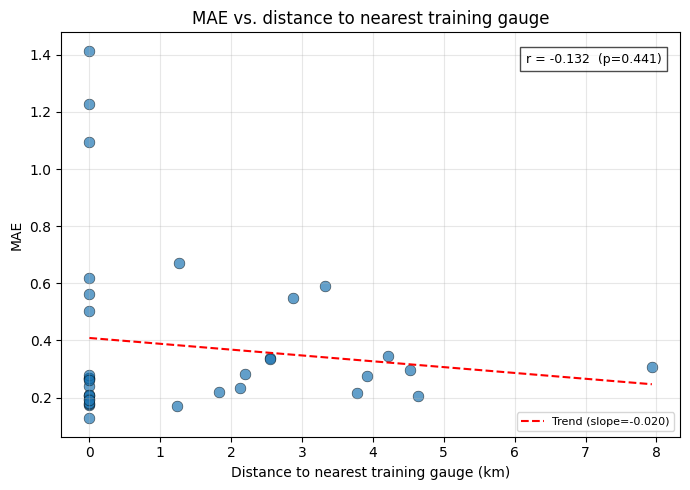

In [18]:
fig, ax = plt.subplots(figsize=(7, 5))
plot_error_vs_isolation(station_df, train_ids, metric="mae", ax=ax)
plt.tight_layout()
plt.show()

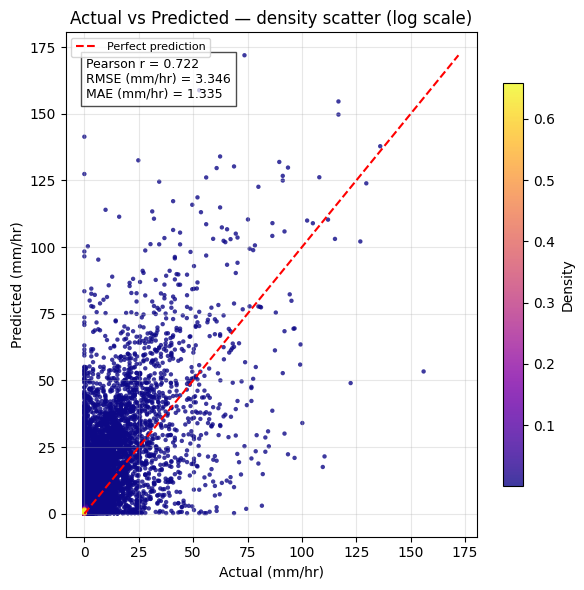

In [19]:
from benchmarks.visualization import plot_density_scatter

# Flatten station_predictions_df / station_actuals_df into 1-D arrays
_actual_flat    = station_actuals_df.values.flatten()
_pred_flat      = station_predictions_df.values.flatten()

fig, ax = plt.subplots(figsize=(6, 6))
plot_density_scatter(
    actual=_actual_flat,
    predicted=_pred_flat,
    model_name="GNN",
    title="Actual vs Predicted — density scatter (log scale)",
    ax=ax,
    log_scale=False,
)
plt.tight_layout()
plt.show()

### Spatial Error Maps — with Basemap + Singapore Outline

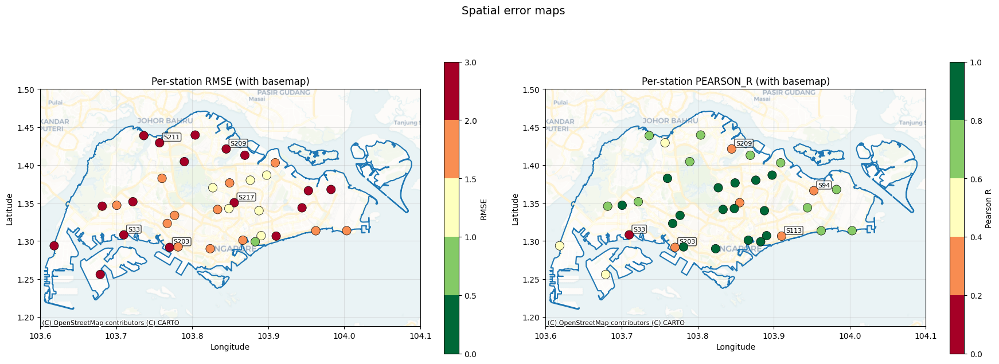

In [20]:
from src.visualization.main import visualise_singapore_outline, visualise_with_basemap

m1, m2 = COMPARE_METRICS
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
plot_spatial_error_map(station_df, BOUNDS, metric=m1, ax=axes[0],
                       title=f"Per-station {m1.upper()} (with basemap)",
                       **METRIC_SCALES.get(m1, {}))
plot_spatial_error_map(station_df, BOUNDS, metric=m2, ax=axes[1],
                       title=f"Per-station {m2.upper()} (with basemap)",
                       **METRIC_SCALES.get(m2, {}))
for ax in axes:
    visualise_with_basemap(ax=ax)
fig.suptitle("Spatial error maps", fontsize=14)
plt.tight_layout()
plt.show()

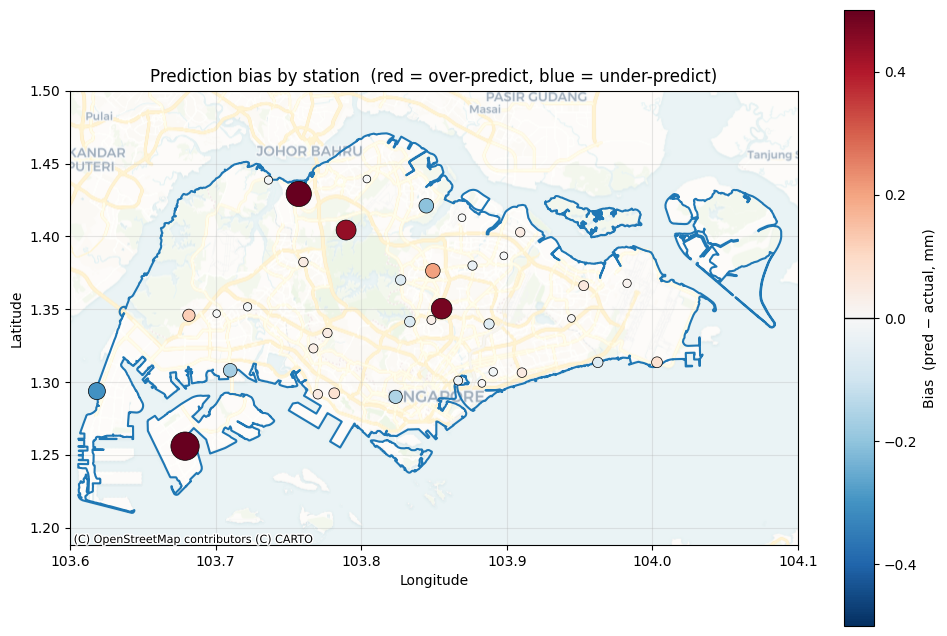

In [21]:
fig, ax = plt.subplots(figsize=(10, 8))
plot_bias_map(station_df, BOUNDS, top_n_labels=0, ax=ax, vmax=0.5)
visualise_singapore_outline(ax=ax)
visualise_with_basemap(ax=ax)
plt.tight_layout()
plt.show()

### Spatial Error Map — CML Overlay

Gauges ringed in teal are within `cml_influence_km` of a CML link and are most likely to benefit from CML as an additional data source.

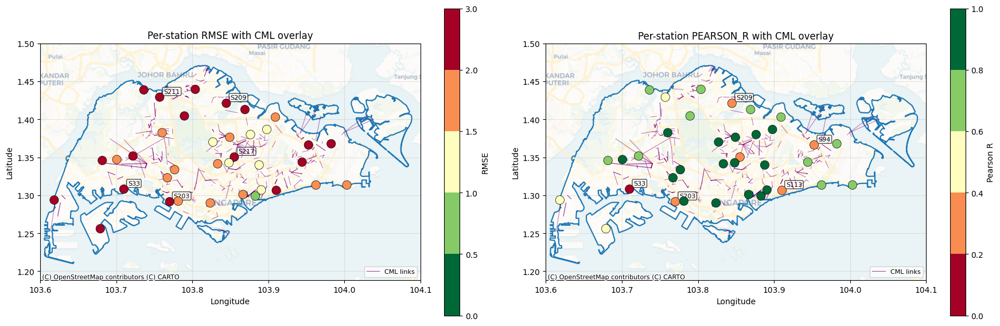

In [22]:
from src.visualization.error_analysis import plot_spatial_error_map_with_cml

fig, ax = plt.subplots(1, 2, figsize=(18, 7))
if cml_coordinates_df is not None:
    for idx, metric in enumerate(COMPARE_METRICS):
        plot_spatial_error_map_with_cml(
            station_df=station_df,
            cml_coordinates_df=cml_coordinates_df,
            bounds=BOUNDS,
            metric=metric,
            cml_influence_km=0,   # gauges within this radius are ringed in teal
            title=f"Per-station {metric.upper()} with CML overlay",
            **METRIC_SCALES.get(metric, {}),
            ax=ax[idx],
        )
        visualise_with_basemap(ax=ax[idx])
else:
    print("cml_coordinates_df not loaded — set 'cml' in DATA_SOURCES to enable this plot.")
plt.tight_layout()
plt.show()

---
# Part 2 – Grid Prediction

Runs the loaded model over every timestep in the test graph and interpolates predictions onto a regular 1 km grid.

In [23]:
# ── Grid prediction settings ──────────────────────────────────────────────────
RESOLUTION_KM = 1.0   # grid spacing in km
KNN_GAUGE     = 5     # how many real gauges each grid point connects to

# Derive LPE settings from the checkpoint (not config) so they always match
# the model that was actually trained.
INCLUDE_LPE = raingauge_in > _DATA_FEATURE_DIM
LPE_K       = raingauge_in - _DATA_FEATURE_DIM   # 0 if no LPE was used
INCLUDE_LPE = True
LPE_K = 4
# ──────────────────────────────────────────────────────────────────────────────
print(f"Running grid prediction on fold {FOLD_IDX} test data …")
print(f"include_lpe={INCLUDE_LPE}  lpe_k={LPE_K}")
predictions, grid_coords, grid_shape = predict_on_grid(
    model=model,
    heterodata=test_heterodata,
    mapping_df=mapping_df,
    bounds=BOUNDS,
    resolution_km=RESOLUTION_KM,
    knn_gauge=KNN_GAUGE,
    device=str(device),
    include_lpe=INCLUDE_LPE,
    lpe_k=LPE_K,
)

T = predictions.shape[0]
print(f"Grid shape  : {grid_shape}  ({grid_shape[0]} rows × {grid_shape[1]} cols)")
print(f"Timesteps   : {T}")
print(f"Pred range  : [{predictions.min():.3f}, {predictions.max():.3f}] mm")

Running grid prediction on fold 0 test data …
include_lpe=True  lpe_k=4
Grid shape  : (35, 56)  (35 rows × 56 cols)
Timesteps   : 29935
Pred range  : [-0.307, 138.903] mm


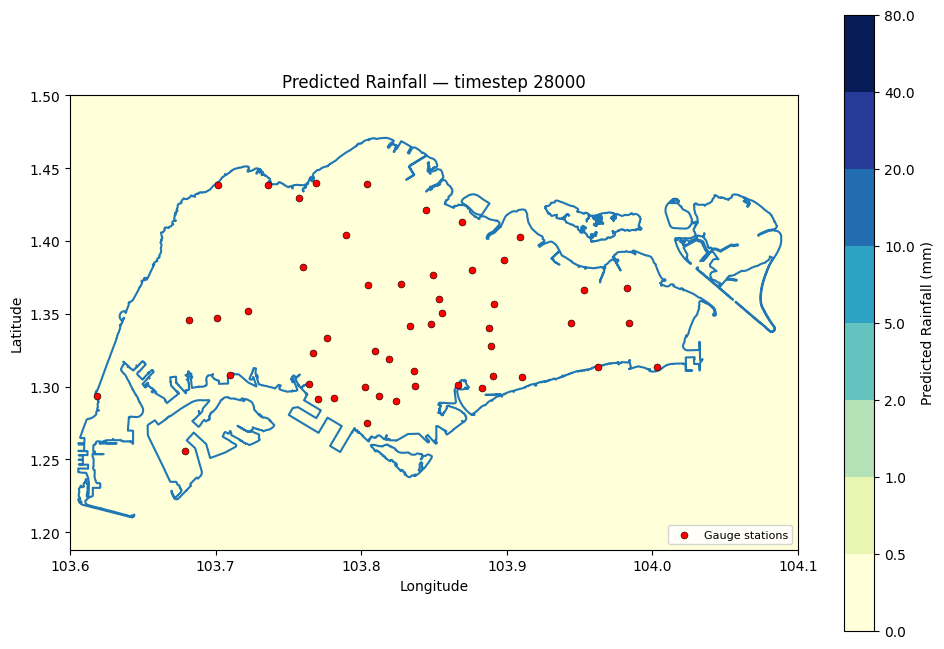

In [24]:
# ── Single timestep ──────────────────────────────────────────────────────────
TIMESTEP = 28000  # change to any index in [0, T)

fig, ax = plt.subplots(figsize=(10, 8))
plot_rainfall_grid(
    predictions, grid_shape, BOUNDS,
    timestamp_idx=TIMESTEP,
    mapping_df=mapping_df,
    title=f"Predicted Rainfall — timestep {TIMESTEP}",
    ax=ax,
    **RAINFALL_SCALE,
)
plt.tight_layout()
plt.show()

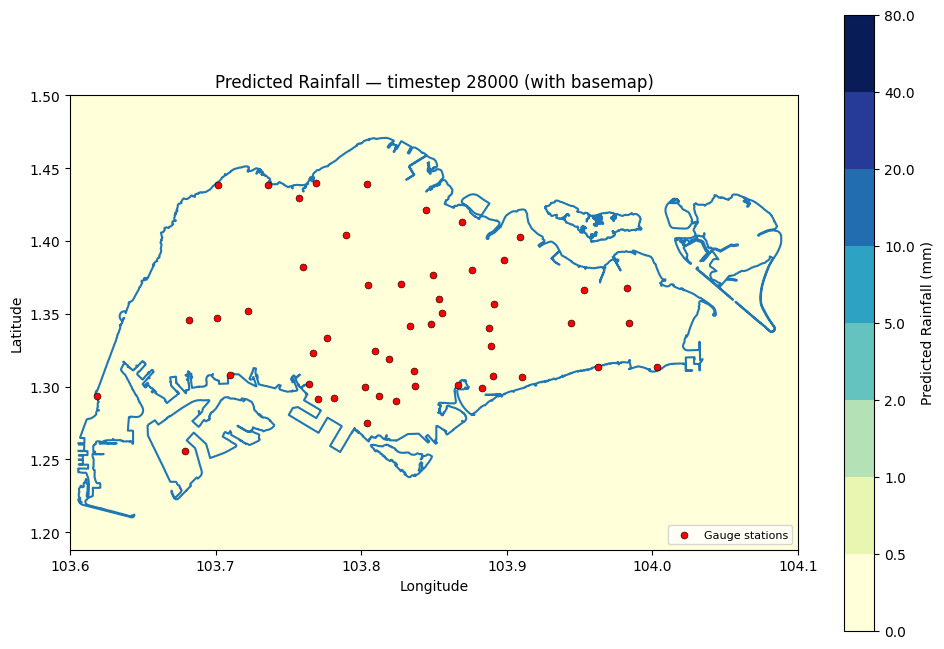

In [25]:
fig, ax = plt.subplots(figsize=(10, 8))
plot_rainfall_grid(
    predictions, grid_shape, BOUNDS,
    timestamp_idx=TIMESTEP,
    mapping_df=mapping_df,
    title=f"Predicted Rainfall — timestep {TIMESTEP} (with basemap)",
    ax=ax,
    **RAINFALL_SCALE,
)
plt.tight_layout()
plt.show()

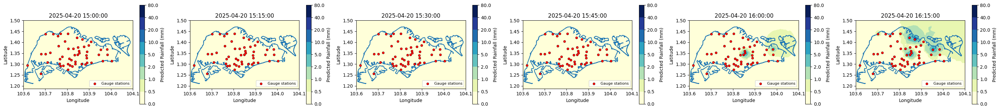

In [31]:
# ── Sequence of timesteps ─────────────────────────────────────────────────────
# 6 contiguous timesteps starting from SEQ_START.
#SEQ_START = 29051  # change to focus on a specific event window
SEQ_START = 29045  # change to focus on a specific event window
timestep_indices = list(range(SEQ_START, SEQ_START + 6))

# Use real timestamps as panel titles if available
seq_titles = [str(aligned_timestamps.iloc[t]) for t in timestep_indices]

fig = plot_rainfall_sequence(
    predictions, grid_shape, BOUNDS,
    timestep_indices=timestep_indices,
    mapping_df=mapping_df,
    titles=seq_titles,
    save_path=f"{EXPERIMENT_DIR}/analysis/grid_sequence.png",
    **RAINFALL_SCALE,
)
plt.show()

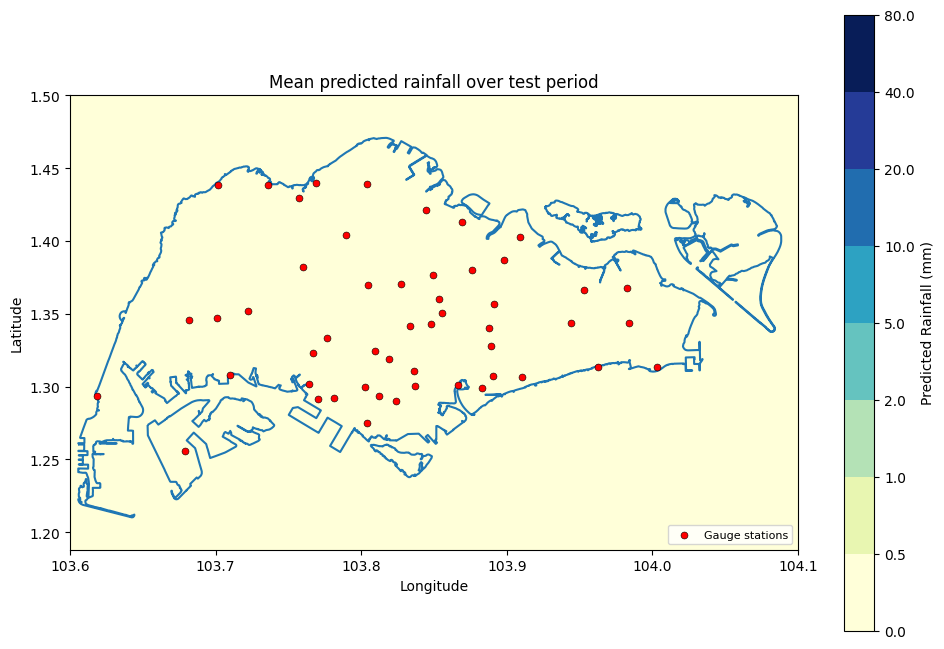

In [27]:
# ── Mean rainfall over entire test period ─────────────────────────────────────
mean_pred = predictions.mean(axis=0)              # [n_rows, n_cols]
mean_pred_4d = mean_pred[np.newaxis, :, :]        # [1, n_rows, n_cols]

fig, ax = plt.subplots(figsize=(10, 8))
plot_rainfall_grid(
    mean_pred_4d, grid_shape, BOUNDS,
    timestamp_idx=0,
    mapping_df=mapping_df,
    title="Mean predicted rainfall over test period",
    ax=ax,
    **RAINFALL_SCALE,
)
plt.tight_layout()
plt.show()

## Time Series Animation

Animate the predicted rainfall grid as a spatial heatmap over time.
`animate_rainfall_grid` returns a `FuncAnimation`; render it inline with `HTML(anim.to_jshtml())`.

Animation saved to experiments/raingauge_cml_radar_final/analysis/rainfall_animation.gif


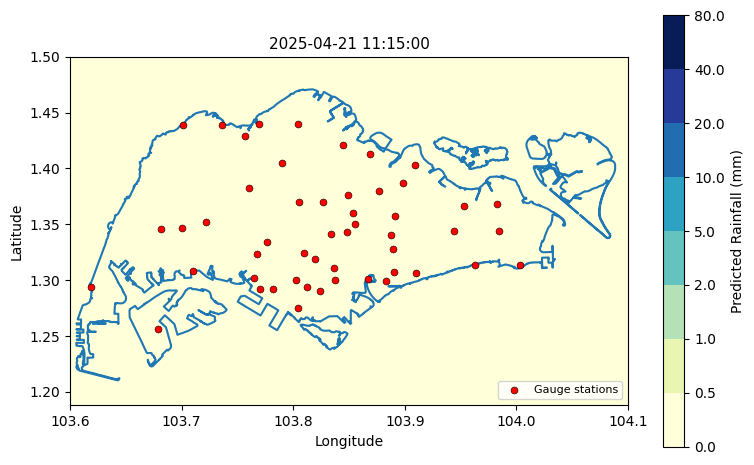

In [33]:
from IPython.display import HTML

# ── Animation settings ────────────────────────────────────────────────────────
# Animate 120 contiguous frames starting from ANIM_START.
# Change ANIM_START to focus on a specific event window.
N_FRAMES    = 120
INTERVAL_MS = 150
ANIM_START  = 29000  # first timestep index to animate

anim_indices = list(range(ANIM_START, ANIM_START + N_FRAMES))

# Pull real timestamps so each frame shows the actual datetime.
anim_timestamps = aligned_timestamps.iloc[anim_indices].tolist()

anim = animate_rainfall_grid(
    predictions, grid_shape, BOUNDS,
    timestep_indices=anim_indices,
    timestamps=anim_timestamps,
    mapping_df=mapping_df,
    interval_ms=INTERVAL_MS,
    save_path=f"{EXPERIMENT_DIR}/analysis/rainfall_animation.gif",
    **RAINFALL_SCALE,
)

HTML(anim.to_jshtml())